Map of folgio loss maps

In [4]:
import os
import sys
os.environ['MPLCONFIGDIR'] = os.getcwd() + "/configs/"
import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pygmt
import pyogrio
pyogrio.core._register_drivers()

MLDir = os.getenv('MLDir')
SimDir = os.getenv('SimDir')
reg = 'CT'
train_size = '1658'
mask_size = '892'

eve_id = np.loadtxt(f'{MLDir}/data/events/sample_events53550.txt',dtype='str')   
#inundation attributes
flood_mask = ~np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
nflood_grids = np.count_nonzero(flood_mask)
zero_mask = np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
index_map = pd.read_csv(f'{MLDir}/data/processed/lat_lon_idx_{reg}_{mask_size}.txt',sep=',',header=None)
index_map.columns = ['m','n','lat','lon'] #add column names

GaugeNo = list(range(35,44)) #for Catania
columnname = str(38)
x_dim = 912
y_dim = 2224
ts_dim = len(GaugeNo)
pts_dim = 480
list_size = ['892','1658','3454','7071'] 
control_points =  [[37.5022,15.0960],
    [37.48876,15.08936],
    [37.47193,15.07816],
    [37.46273,15.08527],
    [37.46252,15.08587],
    [37.45312,15.07874],
    [37.42821,15.08506],
    [37.40958,15.08075],
    [37.38595,15.08539],
    [37.35084,15.08575],
    [37.33049,15.07029],
    [37.40675,15.05037]]

# Load the elevation from netcdf grid
grid = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
ymin = grid['y'].min().values
ymax = grid['y'].max().values
xmin = grid['x'].min().values
xmax = grid['x'].max().values
cptfile_bathy = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy_error.cpt'  

Cadastral AAL

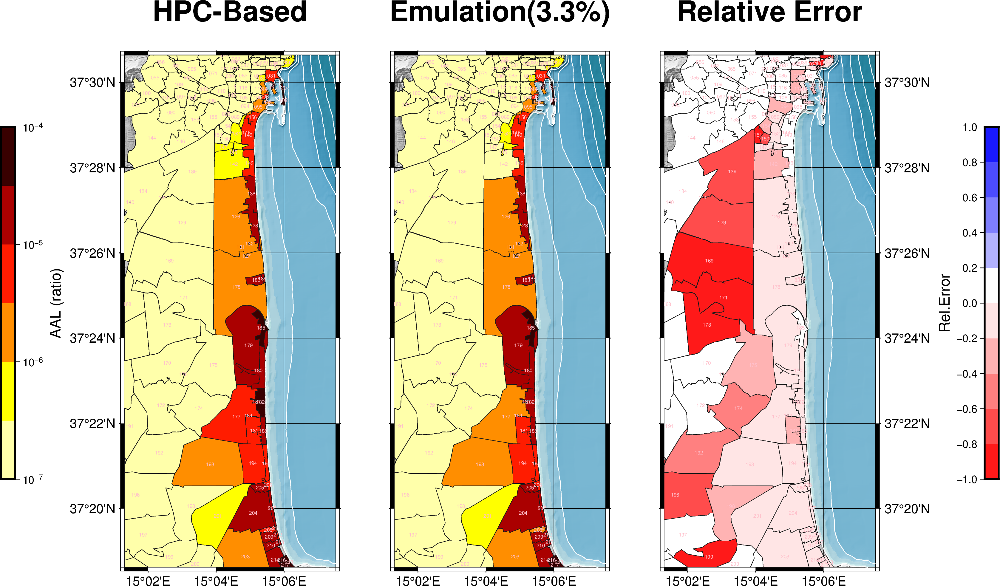

In [15]:
#read shapefile with admin boundaries
cadastral_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_cadastral.shp'
AAL_true = pd.read_csv(f'{MLDir}/risk/results/risk_calc/5_AAL_table_foglio_true.csv')[['foglio_id','value','AAL']].rename(columns={'foglio_id':'FID','AAL':'AAL_true'})
AAL_true['AAL_true'] = AAL_true['AAL_true']/AAL_true['value']
# AAL_0 = pd.read_csv(f'{MLDir}/risk/results/risk_calc/5_AAL_table_foglio_{list_size[0]}.csv')[['foglio_id','AAL']].rename(columns={'foglio_id':'FID','AAL':'AAL_0'})
AAL_1 = pd.read_csv(f'{MLDir}/risk/results/risk_calc/5_AAL_table_foglio_{list_size[1]}.csv')[['foglio_id','value','AAL']].rename(columns={'foglio_id':'FID','AAL':'AAL_1'})
AAL_1['AAL_1'] = AAL_1['AAL_1']/AAL_1['value']
# AAL_2 = pd.read_csv(f'{MLDir}/risk/results/risk_calc/5_AAL_table_foglio_{list_size[2]}.csv')[['foglio_id','AAL']].rename(columns={'foglio_id':'FID','AAL':'AAL_2'})
# AAL_3 = pd.read_csv(f'{MLDir}/risk/results/risk_calc/5_AAL_table_foglio_{list_size[3]}.csv')[['foglio_id','AAL']].rename(columns={'foglio_id':'FID','AAL':'AAL_3'})
cadastral = gpd.read_file(cadastral_path)
cadastral = cadastral.merge(AAL_true, on='FID')
# cadastral = cadastral.merge(AAL_0, on='FID')
cadastral = cadastral.merge(AAL_1, on='FID')
# cadastral = cadastral.merge(AAL_2, on='FID')
# cadastral = cadastral.merge(AAL_3, on='FID')
cadastral['rel_err'] = (cadastral['AAL_1'] - cadastral['AAL_true'] )
cadastral['rel_err'] = cadastral['rel_err']/cadastral['AAL_true']
#set missing value to zero
cadastral['rel_err'] = cadastral['rel_err'].fillna(0)

# plot the cadastral boundaries
fig = pygmt.Figure()
with fig.subplot(
                nrows=1,
                ncols=3,
                subsize = ["7c","20c"],
                sharey = True,
                frame = ["ag"],
                clearance  = "s3c",
                autolabel=False,
    ):
    with fig.set_panel(panel=[0,0]): #true
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tHPC-Based"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        cmap = pygmt.makecpt(cmap='hot',reverse=True, log=True, series = [-7,-4,0.5],background=True)
        # cptfile = f'{MLDir}/risk/plots/cadastral_10_risk.cpt'
        # cmap = pygmt.makecpt(cmap=cptfile,continuous=False)

        fig.plot(data=cadastral,
                pen="0.3p,gray10",
                fill="+z",
                cmap=True,
                aspatial="Z=AAL_true",
                projection='M6c'
                )

        # add annotation for the cadastral boundaries
        for idx, row in cadastral.iterrows():
            x = row.geometry.centroid.x
            y = row.geometry.centroid.y
            fig.text(x=x, y=y, text=row['FOGLIO'], font='4p,pink', justify='CM',projection='M6c')

        # Add colorbar legend
        fig.colorbar(frame=["x+lAAL (ratio)","a1p"],log=True,position="jML+o-3.5c/-1c+w10c/0.4c") #add colorbar legend
  

    with fig.set_panel(panel=[0,1]): #emulation 1
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tEmulation(3.3%)"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

        # pygmt.makecpt(cmap="hot",series=[0,2000,50],continuous=False,reverse=True)
        # cptfile = f'{MLDir}/risk/plots/cadastral_10_risk.cpt'
        # cmap = pygmt.makecpt(cmap=cptfile,continuous=False)
        cmap = pygmt.makecpt(cmap='hot',reverse=True, log=True, series = [-7,-4,0.5],background=True)

        fig.plot(data=cadastral,
                pen="0.3p,gray10",
                fill="+z",
                cmap=True,
                aspatial="Z=AAL_1",
                projection='M6c'
                )

        # add annotation for the cadastral boundaries
        for idx, row in cadastral.iterrows():
            x = row.geometry.centroid.x
            y = row.geometry.centroid.y
            fig.text(x=x, y=y, text=row['FOGLIO'], font='4p,pink', justify='CM',projection='M6c')
    
    with fig.set_panel(panel=[0,2]): #emulation - true /true ie relative error
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tRelative Error"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        
        #make cpt for relative error -1 to 1 with diverging color
        pygmt.makecpt(cmap="polar+h0",series=[-1,1,0.2],continuous=False,reverse=True)
        
        fig.plot(data=cadastral,
                pen="0.3p,gray10",
                fill="+z",
                cmap=True,
                aspatial="Z=rel_err",
                projection='M6c'
                )

        # add annotation for the cadastral boundaries
        for idx, row in cadastral.iterrows():
            x = row.geometry.centroid.x
            y = row.geometry.centroid.y
            fig.text(x=x, y=y, text=row['FOGLIO'], font='4p,pink', justify='CM',projection='M6c')

        # Add colorbar legend
        fig.colorbar(frame=["x+lRel.Error",'a0.2'], position="jMR+o-2.5c/-1c+w10c/0.4c") #add colorbar legend

# plot legend below the map
# fig.legend(position='jBC+o-0.5c/-2c+w8c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Cadastral_AAL.png')
fig.show()

Building Footprint AAL

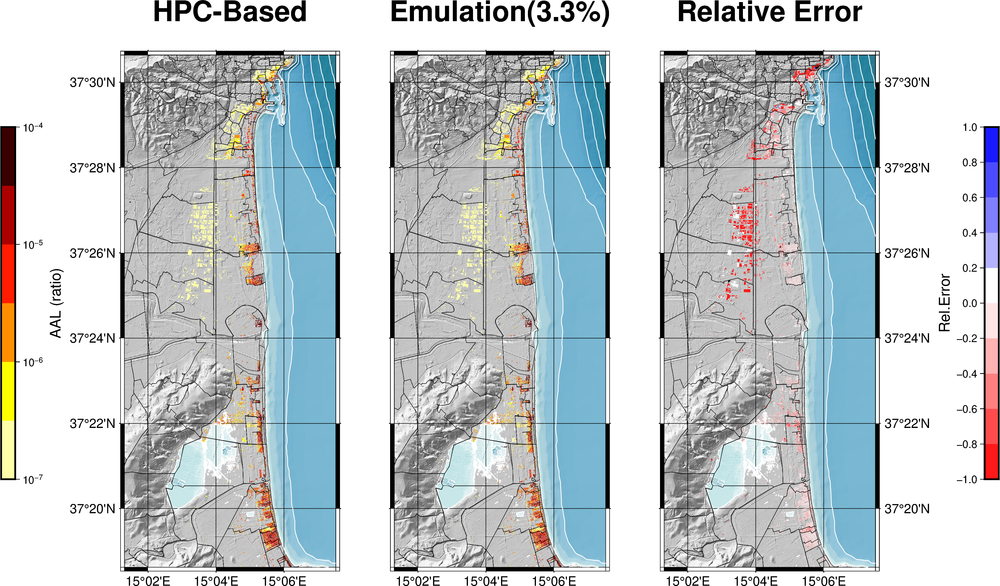

In [16]:
#read geopackage file with building polygons
file_path = f'{MLDir}/risk/exposure/CT_Building_Footprint.gpkg'
buildings_footprint = gpd.read_file(file_path,  layer='Building_Footprint')
buildings_attributes = gpd.read_file(file_path,  layer='Building_Attributes')
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')

AAL_true = pd.read_csv(f'{MLDir}/risk/results/risk_calc/5_AAL_table_asset_true.csv')[['IDAG','value','AAL']].rename(columns={'AAL':'AAL_true'})
AAL_true['AAL_true'] = AAL_true['AAL_true']/AAL_true['value']
AAL_1 = pd.read_csv(f'{MLDir}/risk/results/risk_calc/5_AAL_table_asset_{list_size[1]}.csv')[['IDAG','value','AAL']].rename(columns={'AAL':'AAL_1'})
AAL_1['AAL_1'] = AAL_1['AAL_1']/AAL_1['value']

buildings_footprint = buildings_footprint.merge(AAL_true, on='IDAG')
buildings_footprint = buildings_footprint.merge(AAL_1, on='IDAG')
buildings_footprint['rel_err'] = (buildings_footprint['AAL_1'] - buildings_footprint['AAL_true'] )
buildings_footprint['rel_err'] = buildings_footprint['rel_err']/buildings_footprint['AAL_true']
buildings_footprint['rel_err'] = buildings_footprint['rel_err'].fillna(0)

# plot the buildings
fig = pygmt.Figure()
with fig.subplot(
                nrows=1,
                ncols=3,
                subsize = ["7c","20c"],
                sharey = True,
                frame = ["ag"],
                clearance  = "s3c",
                autolabel=False,
    ):
    with fig.set_panel(panel=[0,0]): #true
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tHPC-Based"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

        # pygmt.makecpt(cmap="hot",series=[0,20,5],continuous=False,reverse=True)
        cmap = pygmt.makecpt(cmap='hot',reverse=True, log=True, series = [-7,-4,0.5],background=True)

        fig.plot(data=buildings_footprint,
                pen=None,
                fill="+z",
                cmap=True,
                aspatial="Z=AAL_true",
                projection='M6c'
                )
        fig.plot(data=cadastral,
                pen="0.1p,black",
                projection='M6c',
                )

        # Add colorbar legend
        fig.colorbar(frame=["x+lAAL (ratio)","a1p"],log=True,position="jML+o-3.5c/-1c+w10c/0.4c") #add colorbar legend

    with fig.set_panel(panel=[0,1]): #emulation 1
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tEmulation(3.3%)"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

        # pygmt.makecpt(cmap="hot",series=[0,20,5],continuous=False,reverse=True)
        cmap = pygmt.makecpt(cmap='hot',reverse=True, log=True, series = [-7,-4,0.5],background=True)

        fig.plot(data=buildings_footprint,
                pen=None,
                fill="+z",
                cmap=True,
                aspatial="Z=AAL_1",
                projection='M6c'
                )

        fig.plot(data=cadastral,
                pen="0.1p,black",
                projection='M6c',
                )

    
    with fig.set_panel(panel=[0,2]): #emulation - true /true ie relative error
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tRelative Error"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        
        #make cpt for relative error -1 to 1 with diverging color
        pygmt.makecpt(cmap="polar+h0",series=[-1,1,0.2],continuous=False,reverse=True)
        
        fig.plot(data=buildings_footprint,
            pen=None,
            fill="+z",
            cmap=True,
            aspatial="Z=rel_err",
            projection='M6c'
            )
        
        fig.plot(data=cadastral,
                pen="0.1p,black",
                projection='M6c',
                )

        # Add colorbar legend
        fig.colorbar(frame=["x+lRel.Error",'a0.2'], position="jMR+o-2.5c/-1c+w10c/0.4c") #add colorbar legend

# plot legend below the map
# fig.legend(position='jBC+o-0.5c/-2c+w8c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Building_AAL.png')
fig.show()

Cadastral PML

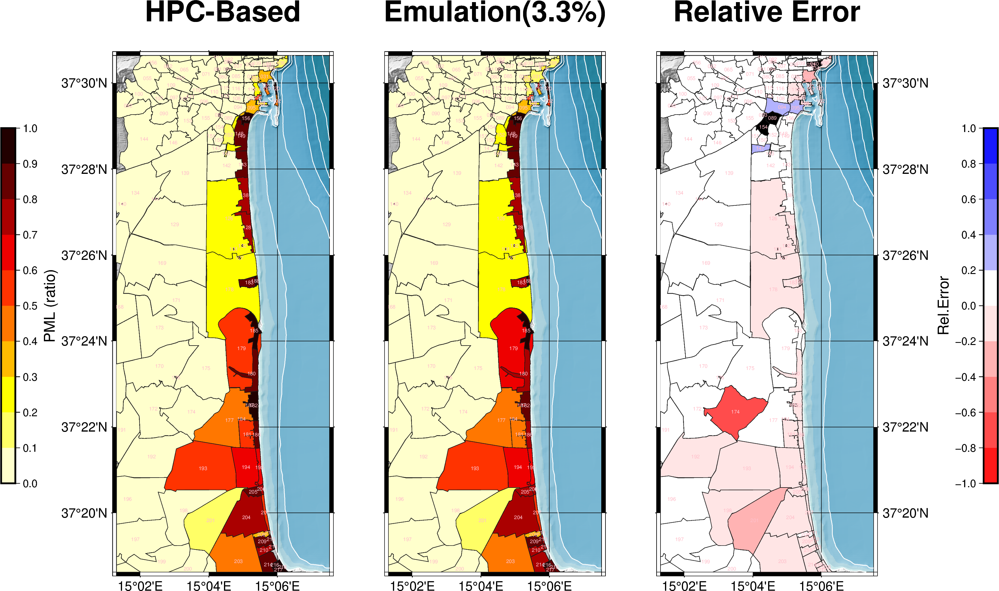

In [ ]:
RP = np.logspace(3,8,50,base=10)
PoE = [1/rp for rp in RP]
#get PoE close to 1e-6
idx = (np.abs(np.array(PoE) - 1e-6)).argmin()
print(f'RP: {RP[idx]} PoE: {PoE[idx]}')

#read shapefile with admin boundaries
cadastral_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_cadastral.shp'
PML_true = pd.read_csv(f'{MLDir}/risk/results/risk_calc/4_PML_table_foglio_true.csv')[['foglio_id',f'PoE{idx}']].rename(columns={'foglio_id':'FID',f'PoE{idx}':'PML_true'})
PML_1 = pd.read_csv(f'{MLDir}/risk/results/risk_calc/4_PML_table_foglio_{list_size[1]}.csv')[['foglio_id',f'PoE{idx}']].rename(columns={'foglio_id':'FID',f'PoE{idx}':'PML_1'})

cadastral = gpd.read_file(cadastral_path)
cadastral = cadastral.merge(PML_true, on='FID')
cadastral = cadastral.merge(PML_1, on='FID')
cadastral['rel_err'] = (cadastral['PML_1'] - cadastral['PML_true'] )
cadastral['rel_err'] = cadastral['rel_err']/cadastral['PML_true']
cadastral['rel_err'] = cadastral['rel_err'].fillna(0)

# plot the cadastral boundaries
fig = pygmt.Figure()
with fig.subplot(
                nrows=1,
                ncols=3,
                subsize = ["7c","20c"],
                sharey = True,
                frame = ["ag"],
                clearance  = "s3c",
                autolabel=False,
    ):
    with fig.set_panel(panel=[0,0]): #true
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tHPC-Based"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

        pygmt.makecpt(cmap="hot",series=[0,1,0.1],continuous=False,reverse=True)
        fig.plot(data=cadastral,
                pen="0.3p,gray10",
                fill="+z",
                cmap=True,
                aspatial="Z=PML_true",
                projection='M6c'
                )

        # add annotation for the cadastral boundaries
        for idx, row in cadastral.iterrows():
            x = row.geometry.centroid.x
            y = row.geometry.centroid.y
            fig.text(x=x, y=y, text=row['FOGLIO'], font='4p,pink', justify='CM',projection='M6c')

        # Add colorbar legend
        fig.colorbar(frame=["x+lPML (ratio)",'a0.1'], position="jML+o-3.25c/-1c+w10c/0.4c") #add colorbar legend

    with fig.set_panel(panel=[0,1]): #emulation 1
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tEmulation(3.3%)"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

        pygmt.makecpt(cmap="hot",series=[0,1,0.1],continuous=False,reverse=True)
        fig.plot(data=cadastral,
                pen="0.3p,gray10",
                fill="+z",
                cmap=True,
                aspatial="Z=PML_1",
                projection='M6c'
                )

        # add annotation for the cadastral boundaries
        for idx, row in cadastral.iterrows():
            x = row.geometry.centroid.x
            y = row.geometry.centroid.y
            fig.text(x=x, y=y, text=row['FOGLIO'], font='4p,pink', justify='CM',projection='M6c')
    
    with fig.set_panel(panel=[0,2]): #emulation - true /true ie relative error
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tRelative Error"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        
        #make cpt for relative error -1 to 1 with diverging color
        pygmt.makecpt(cmap="polar+h0",series=[-1,1,0.2],continuous=False,reverse=True)
        
        fig.plot(data=cadastral,
                pen="0.3p,gray10",
                fill="+z",
                cmap=True,
                aspatial="Z=rel_err",
                projection='M6c'
                )

        # add annotation for the cadastral boundaries
        for idx, row in cadastral.iterrows():
            x = row.geometry.centroid.x
            y = row.geometry.centroid.y
            fig.text(x=x, y=y, text=row['FOGLIO'], font='4p,pink', justify='CM',projection='M6c')

        # Add colorbar legend
        fig.colorbar(frame=["x+lRel.Error",'a0.2'], position="jMR+o-2.5c/-1c+w10c/0.4c") #add colorbar legend

# plot legend below the map
# fig.legend(position='jBC+o-0.5c/-2c+w8c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Cadastral_PML.png')
fig.show()

RP: 910298.1779915227 PoE: 1.0985411419875572e-06


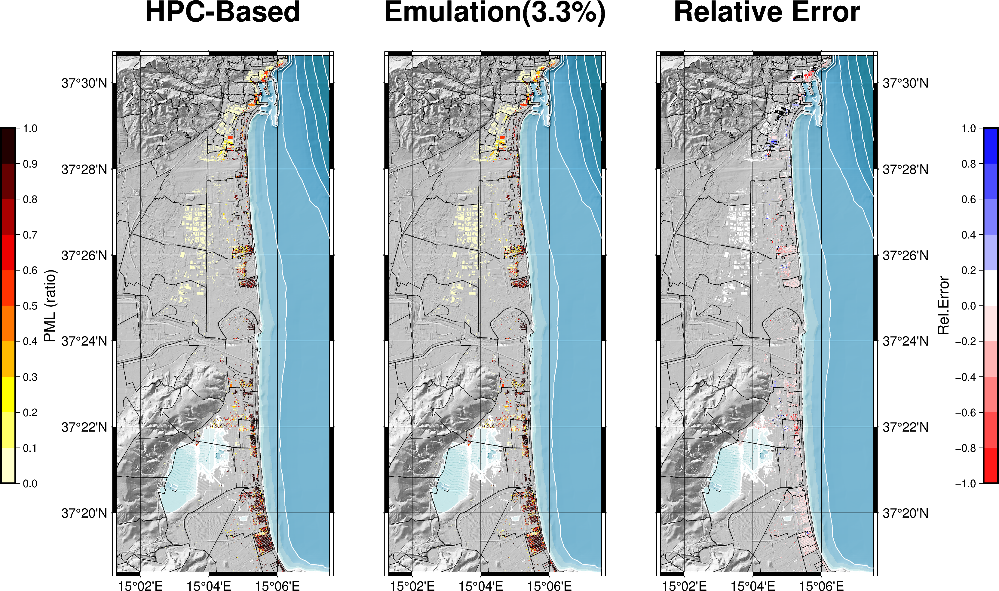

In [12]:
RP = np.logspace(3,8,50,base=10)
PoE = [1/rp for rp in RP]
#get PoE close to 1e-6
idx = (np.abs(np.array(PoE) - 1e-6)).argmin()
print(f'RP: {RP[idx]} PoE: {PoE[idx]}')

#read geopackage file with building polygons
file_path = f'{MLDir}/risk/exposure/CT_Building_Footprint.gpkg'
buildings_footprint = gpd.read_file(file_path,  layer='Building_Footprint')
buildings_attributes = gpd.read_file(file_path,  layer='Building_Attributes')
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')

PML_true = pd.read_csv(f'{MLDir}/risk/results/risk_calc/4_PML_table_asset_true.csv')[['IDAG',f'PoE{idx}']].rename(columns={f'PoE{idx}':'PML_true'})
PML_1 = pd.read_csv(f'{MLDir}/risk/results/risk_calc/4_PML_table_asset_{list_size[1]}.csv')[['IDAG',f'PoE{idx}']].rename(columns={f'PoE{idx}':'PML_1'})

buildings_footprint = buildings_footprint.merge(PML_true, on='IDAG')
buildings_footprint = buildings_footprint.merge(PML_1, on='IDAG')
buildings_footprint['rel_err'] = (buildings_footprint['PML_1'] - buildings_footprint['PML_true'] )
buildings_footprint['rel_err'] = buildings_footprint['rel_err']/buildings_footprint['PML_true']
buildings_footprint['rel_err'] = buildings_footprint['rel_err'].fillna(0)

# plot the buildings
fig = pygmt.Figure()
with fig.subplot(
                nrows=1,
                ncols=3,
                subsize = ["7c","20c"],
                sharey = True,
                frame = ["ag"],
                clearance  = "s3c",
                autolabel=False,
    ):
    with fig.set_panel(panel=[0,0]): #true
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tHPC-Based"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

        pygmt.makecpt(cmap="hot",series=[0,1,0.1],continuous=False,reverse=True)

        fig.plot(data=buildings_footprint,
                pen=None,
                fill="+z",
                cmap=True,
                aspatial="Z=PML_true",
                projection='M6c'
                )

        fig.plot(data=cadastral,
                pen="0.1p,black",
                projection='M6c',
                )

        # Add colorbar legend
        fig.colorbar(frame=["x+lPML (ratio)",'a0.1'], position="jML+o-3.25c/-1c+w10c/0.4c") #add colorbar legend

    with fig.set_panel(panel=[0,1]): #emulation 1
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tEmulation(3.3%)"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

        pygmt.makecpt(cmap="hot",series=[0,1,0.1],continuous=False,reverse=True)

        fig.plot(data=buildings_footprint,
                pen=None,
                fill="+z",
                cmap=True,
                aspatial="Z=PML_1",
                projection='M6c'
                )

        fig.plot(data=cadastral,
                pen="0.1p,black",
                projection='M6c',
                )
    
    with fig.set_panel(panel=[0,2]): #emulation - true /true ie relative error
        #basemap
        cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
        fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame = ["+tRelative Error"])
        fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')
        
        #make cpt for relative error -1 to 1 with diverging color
        pygmt.makecpt(cmap="polar+h0",series=[-1,1,0.2],continuous=False,reverse=True)
        
        fig.plot(data=buildings_footprint,
            pen=None,
            fill="+z",
            cmap=True,
            aspatial="Z=rel_err",
            projection='M6c'
            )
        
        fig.plot(data=cadastral,
                pen="0.1p,black",
                projection='M6c',
                )
        # Add colorbar legend
        fig.colorbar(frame=["x+lRel.Error",'a0.2'], position="jMR+o-2.5c/-1c+w10c/0.4c") #add colorbar legend

# plot legend below the map
# fig.legend(position='jBC+o-0.5c/-2c+w8c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Building_PML.png')
fig.show()